In [1]:
import sys
sys.path.append("/Users/cassswagner/Library/CloudStorage/OneDrive-OregonStateUniversity/oceans_sf")
sys.path.append("/Users/cassidywagner/Library/CloudStorage/OneDrive-OregonStateUniversity/oceans_sf")
import oceans_sf as ocsf

In [2]:
from scipy.io import loadmat
import pandas as pd
import numpy as np
import h5py
import oceans_sf as ocsf
import collections
from calculate_spectral_fluxes import SpectralFlux
from calculate_sfs import StructureFunctions
from flux_sf_figures import *
from matplotlib import pyplot as plt
import time

import seaborn as sns
sns.set_style(style='white')
sns.set_context('notebook')

plt.rcParams['figure.figsize'] = [12,6]
plt.rcParams['figure.dpi'] = 300
# %config InlineBackend.figure_format = 'svg'
import matplotlib_inline.backend_inline
matplotlib_inline.backend_inline.set_matplotlib_formats("retina")

import os
os.environ['PATH'] = os.environ['PATH'] + ':/Library/TeX/texbin'
import matplotlib as mpl
mpl.rcParams['text.usetex'] = True
plt.rcParams['xtick.bottom'] = True
plt.rcParams['ytick.left'] = True
plt.rcParams['xtick.top'] = True
plt.rcParams['ytick.right'] = True

import warnings
warnings.filterwarnings("ignore")

In [3]:
import importlib
# import sys
if 'flux_sf_figures' not in sys.modules:
    import flux_sf_figures            # import module on first run 
else:                      
    import flux_sf_figures      
    importlib.reload(flux_sf_figures)

if 'calculate_sfs' not in sys.modules:
    import calculate_sfs            # import module on first run 
else:                      
    import calculate_sfs      
    importlib.reload(calculate_sfs)

if 'oceans_sf' not in sys.modules:
    import oceans_sf as ocsf            # import module on first run 
else:                      
    import oceans_sf as ocsf     
    importlib.reload(ocsf)

In [4]:
# Read in the data
# filename = "/Users/cassswagner/Library/CloudStorage/OneDrive-OregonStateUniversity/oceans-research/structure-function-turbulence/data_analysis/2layer_128.jld2"
filename = "../GFD_Sims_Output/Data/SurfaceQG_extended_dt_0.00075_n_1024_visc_4.0e-21_order_8_kf_50.0_F_1.0e-5.jld2"
# filename = "/Users/cassswagner/Library/CloudStorage/OneDrive-OregonStateUniversity/oceans-research/2D-forced-dissipative/singlelayerqg_forcedbeta.jld2"

f = h5py.File(filename, "r")
grid = f["grid"]
snapshots = f["snapshots"]

# Set some parameters
Lx = grid["Lx"][()]
Ly = grid["Ly"][()]
nx = grid["nx"][()]
ny = grid["ny"][()]
x = np.asarray(grid["x"])
y = np.asarray(grid["y"])

dx = Lx / nx
dy = Ly / ny

# Sort the snapshots
u_snapshots = collections.OrderedDict(
    sorted(snapshots["u"].items(), key=lambda x: int(x[0]))
)
v_snapshots = collections.OrderedDict(
    sorted(snapshots["v"].items(), key=lambda x: int(x[0]))
)
scalar_snapshots = collections.OrderedDict(
    sorted(snapshots["b"].items(), key=lambda x: int(x[0]))
)

In [5]:
def PostProcess(sfs,dict=True):
    mean_SF_velocity_meridional,mean_SF_velocity_zonal,mean_SF_3rd_velocity_meridional,mean_SF_3rd_velocity_zonal = flux_sf_figures.SFMean(sfs,dict)
    xdiffs, xdiffs_3rd = flux_sf_figures.SeperationDifferences(sfs,dict)
    SF_velocity_zonals,SF_velocity_meridionals,SF_3rd_velocity_zonals,SF_3rd_velocity_meridionals = flux_sf_figures.ReformatSF(sfs,dict)
    boot_SF_vz, boot_SF_vm, boot_SF_3rd_vz, boot_SF_3rd_vm = flux_sf_figures.BootstrapSF(SF_velocity_zonals,SF_velocity_meridionals,SF_3rd_velocity_zonals,SF_3rd_velocity_meridionals)
    return(mean_SF_velocity_zonal,mean_SF_velocity_meridional,xdiffs,boot_SF_vz,boot_SF_vm)

# Reduce resolution of the data and run SF analysis to compare

In [15]:
processed_data = []

for i in [1,2,4,8,16]:

    nbig = int(len(u_snapshots['1920000'][()][0]))
    nsmall = int(nbig / i )
    print(nbig,nsmall)
    start = time.time()
    u_snapshots_sliced = u_snapshots.copy()

    for j in u_snapshots_sliced:
        u_snapshots_sliced[j] = u_snapshots[j][()].reshape([nsmall, nbig//nsmall, nsmall, nbig//nsmall]).mean(3).mean(1)

    v_snapshots_sliced = v_snapshots.copy()

    for j in v_snapshots_sliced:
        v_snapshots_sliced[j] = v_snapshots[j][()].reshape([nsmall, nbig//nsmall, nsmall, nbig//nsmall]).mean(3).mean(1)

    scalar_snapshots_sliced = scalar_snapshots.copy()

    for j in scalar_snapshots_sliced:
        scalar_snapshots_sliced[j] = scalar_snapshots[j][()].reshape([nsmall, nbig//nsmall, nsmall, nbig//nsmall]).mean(3).mean(1)

    # nx_slice = np.shape(u_snapshots_sliced['1920000'])[0]
    # ny_slice = np.shape(u_snapshots_sliced['1920000'])[1]
    x_slice = x.reshape([nsmall, nbig//nsmall]).mean(1)
    y_slice = y.reshape([nsmall, nbig//nsmall]).mean(1)

    end = time.time()
    print('time for slice at %s slice: %.2f'%(i,end-start))
    start = time.time()

    sf_sliced = StructureFunctions(u_snapshots=u_snapshots_sliced,v_snapshots=v_snapshots_sliced,s_snapshots=scalar_snapshots_sliced,
                                                x=x_slice,y=y_slice,boundary=None)
    
    end = time.time()
    print('time for SFs at %s slice: %.2f'%(i,end-start))
    start = time.time()

    meanSFz,meanSFm,xd,SFzboot,SFmboot = PostProcess(sf_sliced,dict=False)
    
    end = time.time()
    print('time for postprocess at %s slice: %.2f'%(i,end-start))    
    
    df = pd.DataFrame(
        {
            "meanSFz": pd.Series(meanSFz),
            "meanSFm": pd.Series(meanSFm),
            "xd": pd.Series(xd),
            "SFzboot": pd.Series(SFzboot),
            "SFmboot": pd.Series(SFmboot)

        }
    ) 

    processed_data.append(df)

#     SF_bootstrap_plot(meanSFz,meanSFm,xd,
#                       SFzboot,SFmboot,"Advective velocity structure functions",ax=ax1)
# plt.show()

1024 1024
time for slice at 1 slice: 0.48
time for SFs at 1 slice: 2193.36
time for postprocess at 1 slice: 5.85
1024 512
time for slice at 2 slice: 0.54
time for SFs at 2 slice: 264.25
time for postprocess at 2 slice: 3.26
1024 256
time for slice at 4 slice: 0.37
time for SFs at 4 slice: 39.06
time for postprocess at 4 slice: 1.22
1024 128
time for slice at 8 slice: 0.35
time for SFs at 8 slice: 5.09
time for postprocess at 8 slice: 0.59
1024 64
time for slice at 16 slice: 0.38
time for SFs at 16 slice: 1.15
time for postprocess at 16 slice: 0.31


In [196]:
nbig = int(len(u_snapshots_sliced['1920000'][()][0]))
nsmall = int(nbig/8)
big = u_snapshots['1920000'][()]
print(nbig,nsmall)
small = big.reshape([nsmall, nbig//nsmall, nsmall, nbig//nsmall]).mean(3).mean(1)

1024 128


In [187]:
x.reshape([nsmall, nbig//nsmall]).mean(1).shape

(16,)

In [160]:
u_snapshot_reduced = (u_snapshots['1920000'][()].reshape(-1,1024).mean(axis=1)).reshape(2,2)

ValueError: cannot reshape array of size 1024 into shape (2,2)

ValueError: cannot reshape array of size 4 into shape (512,512)

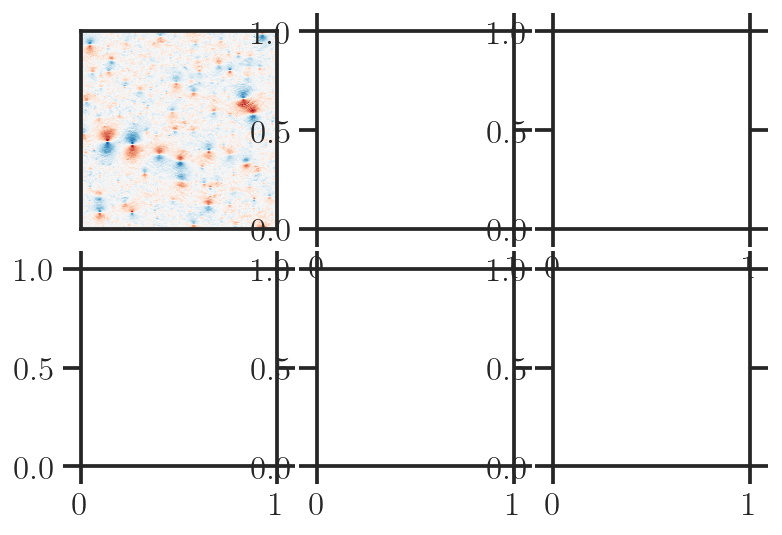

In [8]:
fig,axs = plt.subplots(2,3)
p0 = axs[0,0].pcolormesh(u_snapshots['1920000'][()],vmin=-5,vmax=5,cmap='RdBu')
axs[0,0].set_xticks([])
axs[0,0].set_yticks([])
axs[0,1].pcolormesh((u_snapshots['1920000'][()].reshape(-1,4).mean(axis=0)).reshape(512,512),vmin=-5,vmax=5,cmap='RdBu')
axs[0,1].set_xticks([])
axs[0,1].set_yticks([])
axs[0,2].pcolormesh((u_snapshots['1920000'][()].reshape(-1,16).mean(axis=0)).reshape(256,256),vmin=-5,vmax=5,cmap='RdBu')
axs[0,2].set_xticks([])
axs[0,2].set_yticks([])
axs[1,0].pcolormesh((u_snapshots['1920000'][()].reshape(-1,64).mean(axis=0)).reshape(128,128),vmin=-5,vmax=5,cmap='RdBu')
axs[1,0].set_xticks([])
axs[1,0].set_yticks([])
axs[1,1].pcolormesh((u_snapshots['1920000'][()].reshape(-1,256).mean(axis=0)).reshape(64,64),vmin=-5,vmax=5,cmap='RdBu')
axs[1,1].set_xticks([])
axs[1,1].set_yticks([])
axs[1,2].pcolormesh((u_snapshots['1920000'][()].reshape(-1,256).mean(axis=0)).reshape(64,64),vmin=-5,vmax=5,cmap='RdBu')
axs[1,2].set_xticks([])
axs[1,2].set_yticks([])
fc = mpl.colors.to_rgba('white')
fc = fc[:-1] + (0.7,)
axs[0][0].text(100,100, '%s x %s' %(int(1024/1),int(1024/1)), color='black', 
    bbox=dict(facecolor=fc, edgecolor='grey',boxstyle='round'))
axs[0][1].text(100/2,100/2, '%s x %s' %(int(1024/2),int(1024/2)), color='black', 
    bbox=dict(facecolor=fc, edgecolor='grey',boxstyle='round'))
axs[0][2].text(100/4,100/4, '%s x %s' %(int(1024/4),int(1024/4)), color='black', 
    bbox=dict(facecolor=fc, edgecolor='grey',boxstyle='round'))
axs[1][0].text(100/8,100/8, '%s x %s' %(int(1024/8),int(1024/8)), color='black', 
    bbox=dict(facecolor=fc, edgecolor='grey',boxstyle='round'))
axs[1][1].text(100/16,100/16, '%s x %s' %(int(1024/16),int(1024/16)), color='black', 
    bbox=dict(facecolor=fc, edgecolor='grey',boxstyle='round'))
axs[1][2].text(100/32,100/32, '%s x %s' %(int(1024/32),int(1024/32)), color='black', 
    bbox=dict(facecolor=fc, edgecolor='grey',boxstyle='round'))
# for a in axs:
#     a.set_xticks([])
#     a.set_yticks([])
#     a.set_aspect('equal')
plt.subplots_adjust(wspace=0,hspace=0)
fig.colorbar(p0, ax=axs[:, :], location='right')

In [10]:
advec_e_list = []
advec_n_list = []
u_snapshots_list = []

for i in [4,8,16,32,64,128]:

    start = time.time()
    u_snapshots_sliced = u_snapshots.copy()

    for j in u_snapshots_sliced:
        u_snapshots_sliced[j] = u_snapshots[j][1::i,1::i]

    v_snapshots_sliced = v_snapshots.copy()

    for j in v_snapshots_sliced:
        v_snapshots_sliced[j] = v_snapshots[j][1::i,1::i]

    scalar_snapshots_sliced = scalar_snapshots.copy()

    for j in scalar_snapshots_sliced:
        scalar_snapshots_sliced[j] = scalar_snapshots[j][1::i,1::i]

    # nx_slice = np.shape(u_snapshots_sliced['1920000'])[0]
    # ny_slice = np.shape(u_snapshots_sliced['1920000'])[1]
    x_slice = x[1::i]
    y_slice = y[1::i]

    advec_e, advec_n = ocsf.calculate_velocity_advection(u_snapshots_sliced['1920000'], v_snapshots_sliced['1920000'], x_slice, y_slice)
    # plt.pcolormesh(x_slice,y_slice,advec_e,vmin=-600,vmax=600)
    # plt.colorbar()
    # plt.show()
    # print(abs(u_snapshots_sliced['1920000']).mean())
    # print(abs(u_snapshots_sliced['1920000']).mean())
    advec_e_list.append(advec_e)
    advec_n_list.append(advec_n)
    u_snapshots_list.append(u_snapshots_sliced['1920000'])
    # plt.plot(advec_n.mean(axis=0),linestyle='dotted')

    advec_e_diff = np.roll(advec_e, int(len(x_slice)/2)-1, axis=0) - advec_e
    advec_n_diff = np.roll(advec_n, int(len(x_slice)/2)-1, axis=0) - advec_n
    u_diff = np.roll(u_snapshots_sliced['1920000'], int(len(x_slice)/2)-1, axis=0) - u_snapshots_sliced['1920000']
    v_diff = np.roll(v_snapshots_sliced['1920000'], int(len(x_slice)/2)-1, axis=0) - v_snapshots_sliced['1920000']

    sf = np.nanmean(advec_e_diff * u_diff + advec_n_diff * v_diff)

    # print(np.nanmean(((advec_e_diff*u_diff))), np.nanmean(((advec_n_diff*v_diff))))
    print(np.nanmean(advec_e_diff), np.nanmean(advec_n_diff))

1.9081958235744878e-17 1.1102230246251565e-16
2.0816681711721685e-17 6.938893903907228e-18
3.469446951953614e-18 8.326672684688674e-17
1.5612511283791264e-17 -1.3877787807814457e-17
-2.7755575615628914e-17 6.938893903907228e-18
6.938893903907228e-18 -6.071532165918825e-18


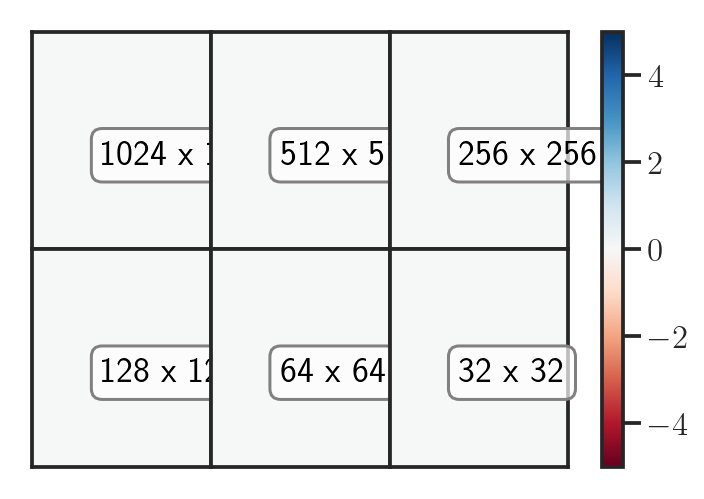

In [11]:
fig,axs = plt.subplots(2,3)
p0 = axs[0,0].pcolormesh(np.roll(u_snapshots_list[0],512,0) - u_snapshots_list[0],vmin=-5,vmax=5,cmap='RdBu')
axs[0,0].set_xticks([])
axs[0,0].set_yticks([])
axs[0,1].pcolormesh(np.roll(u_snapshots_list[1],256,0) - u_snapshots_list[1],vmin=-5,vmax=5,cmap='RdBu')
axs[0,1].set_xticks([])
axs[0,1].set_yticks([])
axs[0,2].pcolormesh(np.roll(u_snapshots_list[2],128,0) - u_snapshots_list[2],vmin=-5,vmax=5,cmap='RdBu')
axs[0,2].set_xticks([])
axs[0,2].set_yticks([])
axs[1,0].pcolormesh(np.roll(u_snapshots_list[3],64,0) - u_snapshots_list[3],vmin=-5,vmax=5,cmap='RdBu')
axs[1,0].set_xticks([])
axs[1,0].set_yticks([])
axs[1,1].pcolormesh(np.roll(u_snapshots_list[4],32,0) - u_snapshots_list[4],vmin=-5,vmax=5,cmap='RdBu')
axs[1,1].set_xticks([])
axs[1,1].set_yticks([])
axs[1,2].pcolormesh(np.roll(u_snapshots_list[5],16,0) - u_snapshots_list[5],vmin=-5,vmax=5,cmap='RdBu')
axs[1,2].set_xticks([])
axs[1,2].set_yticks([])
fc = mpl.colors.to_rgba('white')
fc = fc[:-1] + (0.7,)
axs[0][0].text(100,100, '%s x %s' %(int(1024/1),int(1024/1)), color='black', 
    bbox=dict(facecolor=fc, edgecolor='grey',boxstyle='round'))
axs[0][1].text(100/2,100/2, '%s x %s' %(int(1024/2),int(1024/2)), color='black', 
    bbox=dict(facecolor=fc, edgecolor='grey',boxstyle='round'))
axs[0][2].text(100/4,100/4, '%s x %s' %(int(1024/4),int(1024/4)), color='black', 
    bbox=dict(facecolor=fc, edgecolor='grey',boxstyle='round'))
axs[1][0].text(100/8,100/8, '%s x %s' %(int(1024/8),int(1024/8)), color='black', 
    bbox=dict(facecolor=fc, edgecolor='grey',boxstyle='round'))
axs[1][1].text(100/16,100/16, '%s x %s' %(int(1024/16),int(1024/16)), color='black', 
    bbox=dict(facecolor=fc, edgecolor='grey',boxstyle='round'))
axs[1][2].text(100/32,100/32, '%s x %s' %(int(1024/32),int(1024/32)), color='black', 
    bbox=dict(facecolor=fc, edgecolor='grey',boxstyle='round'))
# for a in axs:
#     a.set_xticks([])
#     a.set_yticks([])
#     a.set_aspect('equal')
plt.subplots_adjust(wspace=0,hspace=0)
fig.colorbar(p0, ax=axs[:, :], location='right')

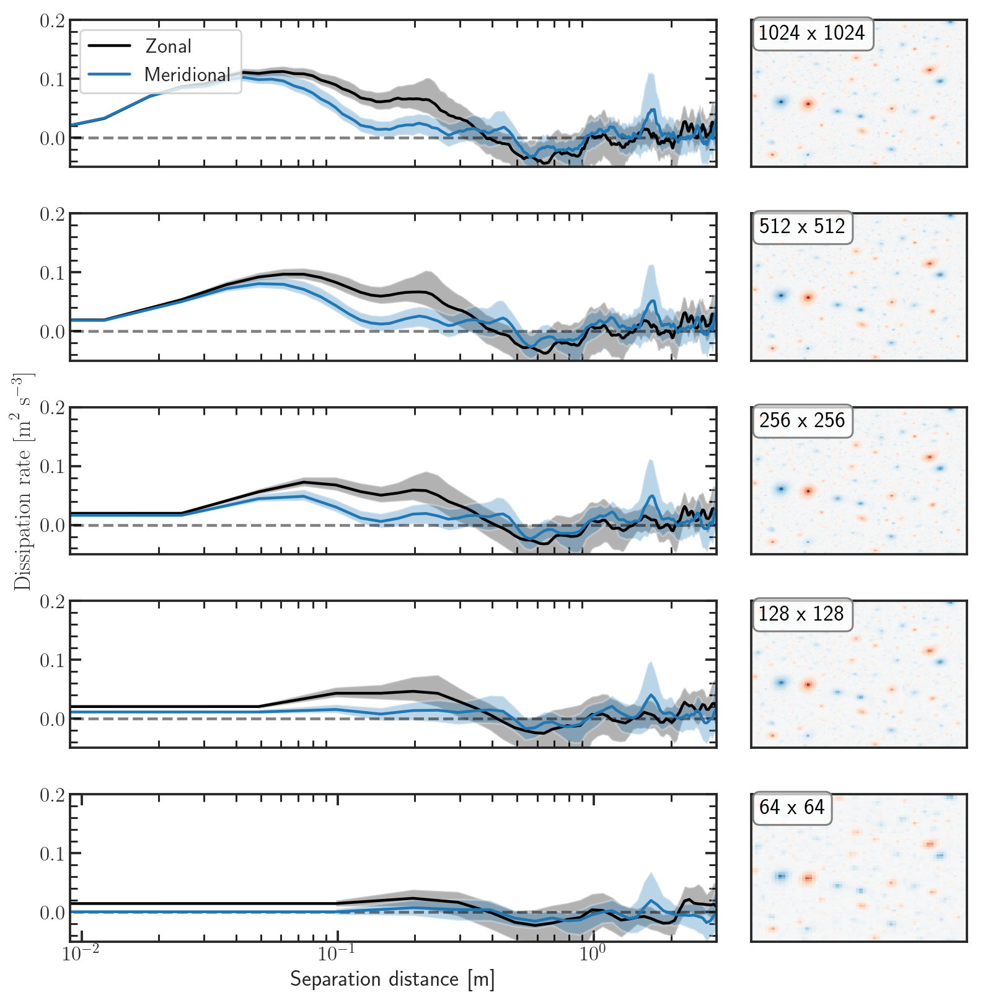

In [16]:
fig, axes = plt.subplots(5,2,figsize=(12, 12),gridspec_kw={'width_ratios': [3, 1]})

# axes.tick_params(direction="in", which="both")
# axes.xaxis.get_ticklocs(minor=True)
# axes.minorticks_on()

fc = mpl.colors.to_rgba('white')
fc = fc[:-1] + (0.7,)

slices = [1,2,4,8,16]
for i in range(0,5):

    nbig = int(len(u_snapshots['1920000'][()][0]))
    nsmall = int(nbig / slices[i] )

    data = processed_data[i]
    flux_sf_figures.SF_bootstrap_plot(SFz=data.meanSFz/2,SFm=data.meanSFm/2,xdiffs=data.xd,ydiffs=data.xd,
                                      bootz0=data.SFzboot[0].confidence_interval[0]/2, bootz1=data.SFzboot[0].confidence_interval[1]/2, 
                                      bootm0=data.SFmboot[0].confidence_interval[0]/2, bootm1=data.SFmboot[0].confidence_interval[1]/2, 
                                      label1='Zonal', label2="Meridional",
                                      title='Advel SFs',ax=axes[i][0])
    axes[i][0].set_xlim(9e-3,3e0)
    axes[i][0].set_ylim(-0.05,0.2)
    axes[i][0].legend(loc='upper left')
    axes[i][0].tick_params(direction="in", which="both")
    axes[i][0].xaxis.get_ticklocs(minor=True)
    axes[i][0].minorticks_on()
    if i < 4:
        axes[i][0].set_xlabel("")
        axes[i][0].set_xticks([])
    if i > 0:
        axes[i][0].legend("", frameon=False)

    axes[i][0].set_ylabel("")

    axes[i][1].pcolormesh(x.reshape([nsmall, nbig//nsmall]).mean(1),y.reshape([nsmall, nbig//nsmall]).mean(1),scalar_snapshots['1920000'][()].reshape([nsmall, nbig//nsmall, nsmall, nbig//nsmall]).mean(3).mean(1),cmap="RdBu",vmin=scalar_snapshots['1920000'][()].min(),vmax=scalar_snapshots['1920000'][()].max())
    axes[i][1].set_xticks([])
    axes[i][1].set_yticks([])
    axes[i][1].text(-2.9,2.3, '%s x %s' %(int(1024/slices[i]),int(1024/slices[i])), color='black', 
        bbox=dict(facecolor=fc, edgecolor='grey',boxstyle='round'))
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
axes[2][0].set_ylabel(r'$\mathrm{Dissipation~rate~ [m}^2\mathrm{~s}^{-3}]$')
plt.tight_layout()

## Calculate correlations between low resolution data

In [218]:
from scipy import interpolate
from scipy.stats import pearsonr   

for i in range(0,5):

    f = interpolate.InterpolatedUnivariateSpline(processed_data[i][1:].xd, processed_data[i][1:].meanSFz)
    xd2_new = np.linspace(processed_data[i].xd[1],processed_data[i].xd[len(processed_data[i].xd)-1],len(processed_data[0].xd[1:]))
    meanSFz2_new = f(xd2_new)
    print("correlation between original and %s x %s: %.3f" %(int(1024/slices[i]), int(1024/slices[i]), pearsonr(processed_data[0][1:].meanSFz,meanSFz2_new)[0]))

correlation between original and 1024 x 1024: 1.000
correlation between original and 512 x 512: 0.995
correlation between original and 256 x 256: 0.970
correlation between original and 128 x 128: 0.894
correlation between original and 64 x 64: 0.330


# Try different width swaths and run SF analysis to compare

In [8]:
# plt.colorbar()
sf_swath = None
for step in [128]:
    # plt.pcolormesh(x,y,scalar_snapshots['1920000'],cmap='Greys')
    swath_length = 8
    for i in range(0,1024,step):
        # plt.pcolormesh(x,y[i:i+swath_length],scalar_snapshots['1920000'][i:i+swath_length,:],cmap='RdBu',vmin=-15,vmax=15)
        
        u_snapshots_swath = u_snapshots.copy()
        for j in u_snapshots_swath:
            u_snapshots_swath[j] = u_snapshots_swath[j][i:i+swath_length,:]

        v_snapshots_swath = v_snapshots.copy()
        for j in v_snapshots_swath:
            v_snapshots_swath[j] = v_snapshots_swath[j][i:i+swath_length,:]

        scalar_snapshots_swath = scalar_snapshots.copy()
        for j in scalar_snapshots_swath:
            scalar_snapshots_swath[j] = scalar_snapshots_swath[j][i:i+swath_length,:]

        x_swath = x
        y_swath = y[i:i+swath_length]

        if sf_swath is not None:
            sf_swath_new = calculate_sfs.StructureFunctions(u_snapshots_swath,v_snapshots_swath,
                                                            scalar_snapshots_swath,grid,x_swath,y_swath,boundary=None)
            sf_swath = pd.concat([sf_swath,sf_swath_new])
        else:
            sf_swath = calculate_sfs.StructureFunctions(u_snapshots_swath,v_snapshots_swath,
                                                        scalar_snapshots_swath,grid,x_swath,y_swath,boundary=None)

    agg_functions = {'Snapshot': 'first', 'SFv_adv': 'mean', 'SFv_2nd': 'mean', 'SFv_3rd': 'mean'}

    sf_swath = sf_swath.groupby([sf_swath.index,'Snapshot']).aggregate(agg_functions).droplevel(level=1)
    meanSFz,meanSFm,xd,SFzboot,SFmboot = PostProcess(sf_swath,dict=False)
        
        #calculate sfs
    #average sfs
    #append sfs

/Users/cassswagner/miniconda3/envs/.venv/lib/python3.9/site-packages/scipy/stats/_bootstrap.py:119: RuntimeWarning: invalid value encountered in divide
  a_hat = num / den
/Users/cassswagner/miniconda3/envs/.venv/lib/python3.9/site-packages/scipy/stats/_bootstrap.py:93: BootstrapDegenerateDistributionWarning: The bootstrap distribution is degenerate; the confidence interval is not defined.
  warnings.warn(BootstrapDegenerateDistributionWarning())


In [9]:
sf_swath

,Snapshot,SFv_adv,SFv_2nd,SFv_3rd
SF_isotropic,1040000,NaN,NaN,NaN
SF_isotropic,1120000,NaN,NaN,NaN
SF_isotropic,1200000,NaN,NaN,NaN
SF_isotropic,1280000,NaN,NaN,NaN
SF_isotropic,1360000,NaN,NaN,NaN
...,...,...,...,...
y-diffs_uneven,1920000,NaN,NaN,NaN
y-diffs_uneven,720000,NaN,NaN,NaN
y-diffs_uneven,800000,NaN,NaN,NaN
y-diffs_uneven,880000,NaN,NaN,NaN


In [456]:
sf_swath = calculate_sfs.StructureFunctions(u_snapshots_swath,v_snapshots_swath,
                                            scalar_snapshots_swath,grid,x_swath,y_swath)

In [463]:
sf_swath.loc[sf_swath['Snapshot'] == '720000'].groupby(sf_swath.index).mean(axis=1)#.SFv_adv.SF_meridional.mean(axis=0)

ValueError: Grouper and axis must be same length

In [467]:
sf_swath.groupby([sf_swath.index,'Snapshot']).mean()

SFv_adv SFv_2nd SFv_3rd
               Snapshot                        
SF_isotropic   1040000      NaN     NaN     NaN
               1120000      NaN     NaN     NaN
               1200000      NaN     NaN     NaN
               1280000      NaN     NaN     NaN
               1360000      NaN     NaN     NaN
...                         ...     ...     ...
y-diffs_uneven 1920000      NaN     NaN     NaN
               720000       NaN     NaN     NaN
               800000       NaN     NaN     NaN
               880000       NaN     NaN     NaN
               960000       NaN     NaN     NaN

[144 rows x 3 columns]

In [514]:
agg_functions = {'Snapshot': 'first', 'SFv_adv': 'mean', 'SFv_2nd': 'mean', 'SFv_3rd': 'mean'}

test_swath = sf_swath.groupby([sf_swath.index,'Snapshot']).aggregate(agg_functions)#.droplevel(level=1)
#test_swath.sort_values(by='Snapshot', key=lambda s: s.astype(int))

In [25]:
type(u_snapshots)

collections.OrderedDict

In [36]:
def SwathReduction(dir='zonal',dict=True,boundary="Periodic",even=True,
                   cut=(nx/[64,32,16,8,4]).astype(int)):

    processed_data_swath = []

    # sfs_swath = ocsf.advection_velocity(u_[20:50,:], v_[20:50,:], x, y[20:50],boundary="Periodic")

    for i in cut:
        start = time.time()
        u_snapshots_sliced = u_snapshots.copy()

        if dir == 'zonal':
            for j in u_snapshots_sliced:
                u_snapshots_sliced[j] = u_snapshots[j][:i,:]

            v_snapshots_sliced = v_snapshots.copy()

            for j in v_snapshots_sliced:
                v_snapshots_sliced[j] = v_snapshots[j][:i,:]

            scalar_snapshots_sliced = scalar_snapshots.copy()

            for j in scalar_snapshots_sliced:
                scalar_snapshots_sliced[j] = scalar_snapshots[j][:i,:]

            # nx_slice = np.shape(u_snapshots_sliced['1920000'])[0]
            # ny_slice = np.shape(u_snapshots_sliced['1920000'])[1]
            x_slice = x
            y_slice = y[:i]

        elif dir == 'meridional':
            for j in u_snapshots_sliced:
                u_snapshots_sliced[j] = u_snapshots[j][:,:i]

            v_snapshots_sliced = v_snapshots.copy()

            for j in v_snapshots_sliced:
                v_snapshots_sliced[j] = v_snapshots[j][:,:i]

            scalar_snapshots_sliced = scalar_snapshots.copy()

            for j in scalar_snapshots_sliced:
                scalar_snapshots_sliced[j] = scalar_snapshots[j][:,:i]

            # nx_slice = np.shape(u_snapshots_sliced['1920000'])[0]
            # ny_slice = np.shape(u_snapshots_sliced['1920000'])[1]
            x_slice = x[:i]
            y_slice = y
        
        else:
            raise ValueError('Need to specify meridional or zonal as dir, the direction of swath reduction.')


        # end = time.time()
        # print('time for slice at %s slice: %.2f'%(i,end-start))
        # start = time.time()

        sf_sliced = calculate_sfs.StructureFunctions(u_snapshots_sliced,v_snapshots_sliced,scalar_snapshots_sliced,grid,
                                                    x_slice,y_slice,boundary,even)
        print("cut=%s" %i)
        # end = time.time()
        # print('time for SFs at %s slice: %.2f'%(i,end-start))
        # start = time.time()

        meanSFz,meanSFm,xd,SFzboot,SFmboot = PostProcess(sf_sliced,dict)
        
        # end = time.time()
        # print('time for postprocess at %s slice: %.2f'%(i,end-start))    
        
        df = pd.DataFrame(
            {
                "meanSFz": pd.Series(meanSFz),
                "meanSFm": pd.Series(meanSFm),
                "xd": pd.Series(xd),
                "SFzboot": pd.Series(SFzboot),
                "SFmboot": pd.Series(SFmboot)

            }
        ) 

        processed_data_swath.append(df)
    return(processed_data_swath)

In [37]:
processed_data_swath_zonal = SwathReduction(dict=False,boundary=None,even=False)

cut=16
cut=32
cut=64
cut=128
cut=256


In [38]:
processed_data_swath_meridional = SwathReduction(dir='meridional',dict=False,boundary=None,even=False)

cut=16
cut=32
cut=64
cut=128
cut=256


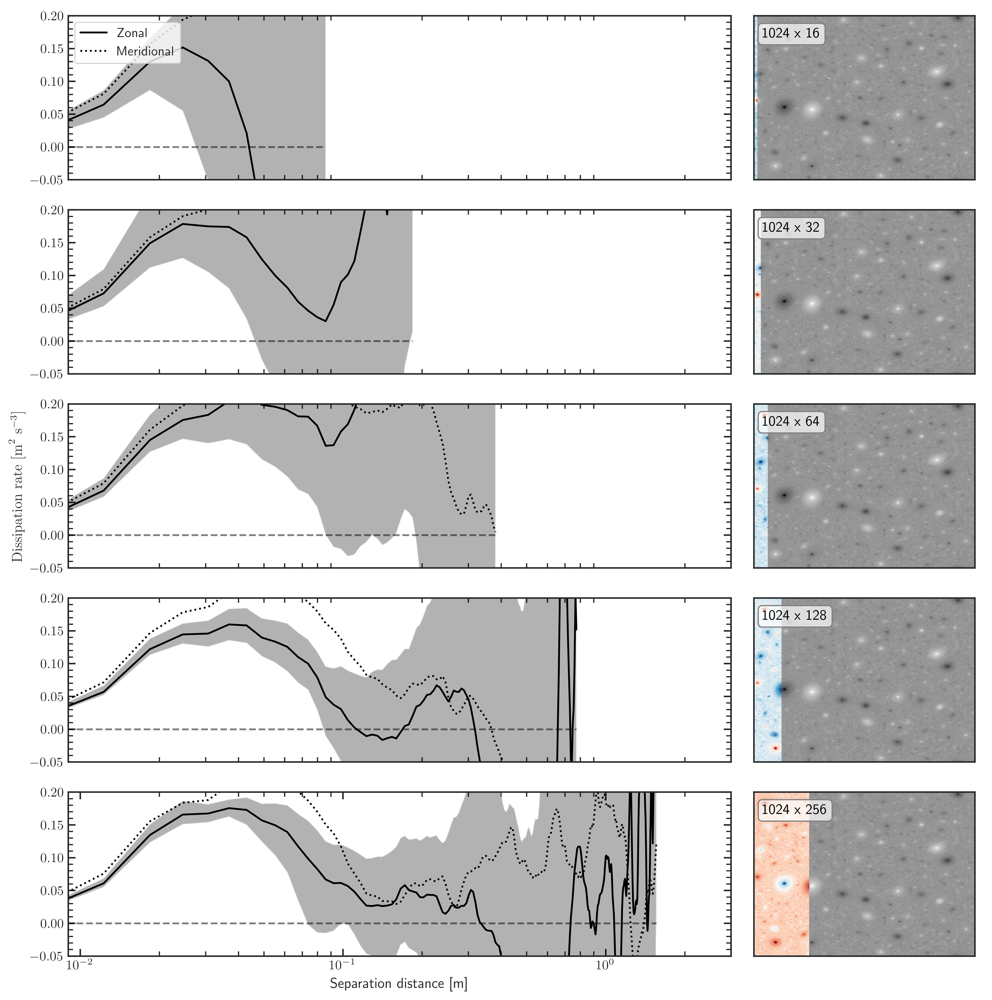

In [40]:
fig, axes = plt.subplots(5,2,figsize=(12, 12),gridspec_kw={'width_ratios': [3, 1]})

# axes.tick_params(direction="in", which="both")
# axes.xaxis.get_ticklocs(minor=True)
# axes.minorticks_on()

fc = mpl.colors.to_rgba('white')
fc = fc[:-1] + (0.7,)

# slices = [1,2,4,8,16]
slices = [64,32,16,8,4]
for i in range(0,5):
    cut = int(nx/slices[i])

    data = processed_data_swath_meridional[i]
    flux_sf_figures.SF_bootstrap_plot(data.meanSFz,data.meanSFm,data.xd,data.xd,data.SFzboot[0].confidence_interval[0],data.SFzboot[0].confidence_interval[1], 'Advel SFs',ax=axes[i][0])
    axes[i][0].set_xlim(9e-3,3e0)
    axes[i][0].set_ylim(-0.05,0.2)
    axes[i][0].legend(loc='upper left')
    axes[i][0].tick_params(direction="in", which="both")
    axes[i][0].xaxis.get_ticklocs(minor=True)
    axes[i][0].minorticks_on()
    if i < 4:
        axes[i][0].set_xlabel("")
        axes[i][0].set_xticks([])
    if i > 0:
        axes[i][0].legend("", frameon=False)

    axes[i][0].set_ylabel("")

    axes[i][1].pcolormesh(x,y,scalar_snapshots['1920000'],cmap="Greys")
    axes[i][1].pcolormesh(x[:cut],y,scalar_snapshots['1920000'][:,:cut],cmap="RdBu")
    axes[i][1].set_xticks([])
    axes[i][1].set_yticks([])
    axes[i][1].text(-2.9,2.3, '1024 x %s' %cut, color='black', 
        bbox=dict(facecolor=fc, edgecolor='grey',boxstyle='round'))
fig.add_subplot(111, frameon=False)
# hide tick and tick label of the big axis
plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
axes[2][0].set_ylabel(r'$\mathrm{Dissipation~rate~ [m}^2\mathrm{~s}^{-3}]$')
plt.tight_layout()

## Profiling

In [30]:
%load_ext line_profiler

def SwathReduction(dir='zonal',dict=True,boundary="Periodic",even=True,
                   cut=(nx/[256]).astype(int)):

    processed_data_swath = []

    # sfs_swath = ocsf.advection_velocity(u_[20:50,:], v_[20:50,:], x, y[20:50],boundary="Periodic")

    for i in cut:
        start = time.time()
        u_snapshots_sliced = u_snapshots.copy()

        if dir == 'zonal':
            for j in u_snapshots_sliced:
                u_snapshots_sliced[j] = u_snapshots[j][:i,:]

            v_snapshots_sliced = v_snapshots.copy()

            for j in v_snapshots_sliced:
                v_snapshots_sliced[j] = v_snapshots[j][:i,:]

            scalar_snapshots_sliced = scalar_snapshots.copy()

            for j in scalar_snapshots_sliced:
                scalar_snapshots_sliced[j] = scalar_snapshots[j][:i,:]

            # nx_slice = np.shape(u_snapshots_sliced['1920000'])[0]
            # ny_slice = np.shape(u_snapshots_sliced['1920000'])[1]
            x_slice = x
            y_slice = y[:i]

        elif dir == 'meridional':
            for j in u_snapshots_sliced:
                u_snapshots_sliced[j] = u_snapshots[j][:,:i]

            v_snapshots_sliced = v_snapshots.copy()

            for j in v_snapshots_sliced:
                v_snapshots_sliced[j] = v_snapshots[j][:,:i]

            scalar_snapshots_sliced = scalar_snapshots.copy()

            for j in scalar_snapshots_sliced:
                scalar_snapshots_sliced[j] = scalar_snapshots[j][:,:i]

            # nx_slice = np.shape(u_snapshots_sliced['1920000'])[0]
            # ny_slice = np.shape(u_snapshots_sliced['1920000'])[1]
            x_slice = x[:i]
            y_slice = y
        
        else:
            raise ValueError('Need to specify meridional or zonal as dir, the direction of swath reduction.')


        # end = time.time()
        # print('time for slice at %s slice: %.2f'%(i,end-start))
        # start = time.time()

        # appended_data = []

        SFv_adv = [ocsf.advection_velocity(u_snapshots_sliced[j], v_snapshots_sliced[j],x,y,boundary,even) for j in u_snapshots_sliced]

        for j in u_snapshots_sliced:
            # Calculate the velocity SFs
            SFv_adv = ocsf.advection_velocity(
                u_snapshots_sliced[j], v_snapshots_sliced[j], x, y, boundary, even
            )
            # SFv_2nd = ocsf.traditional_velocity(
            #     u_snapshots_sliced[j],
            #     v_snapshots_sliced[j],
            #     x,
            #     y,
            #     boundary,
            #     order=2,
            #     even=even,
            # )
            # SFv_3rd = ocsf.traditional_velocity(
            #     u_snapshots_sliced[j], v_snapshots_sliced[j], x, y, boundary, order=3, even=even
            # )

            # try:
            #     df
            # except NameError:

            #     df = pd.DataFrame(
            #         {
            #             "Snapshot": j,
            #             "SFv_adv": pd.Series(SFv_adv),
            #             "SFv_2nd": pd.Series(SFv_2nd),
            #             "SFv_3rd": pd.Series(SFv_3rd),
            #             # "SFs_adv": pd.Series(SFs_adv),
            #             # "SFs_2nd": pd.Series(SFs_2nd),
            #             # "SFs_3rd": pd.Series(SFs_3rd),
            #         }
            #     )

        #     df_new = pd.DataFrame(
        #         {
        #             "Snapshot": j,
        #             "SFv_adv": pd.Series(SFv_adv),
        #             "SFv_2nd": pd.Series(SFv_2nd),
        #             "SFv_3rd": pd.Series(SFv_3rd),
        #             # "SFs_adv": pd.Series(SFs_adv),
        #             # "SFs_2nd": pd.Series(SFs_2nd),
        #             # "SFs_3rd": pd.Series(SFs_3rd),
        #         }
        #     )

        #     df = pd.concat([df, df_new])
        #     # appended_data.append(df)
        # sf_sliced = df
        
        print("cut=%s" %i)
        # end = time.time()
        # print('time for SFs at %s slice: %.2f'%(i,end-start))
        # start = time.time()

    #     meanSFz,meanSFm,xd,SFzboot,SFmboot = PostProcess(sf_sliced,dict)
        
    #     # end = time.time()
    #     # print('time for postprocess at %s slice: %.2f'%(i,end-start))    
        
    #     df = pd.DataFrame(
    #         {
    #             "meanSFz": pd.Series(meanSFz),
    #             "meanSFm": pd.Series(meanSFm),
    #             "xd": pd.Series(xd),
    #             "SFzboot": pd.Series(SFzboot),
    #             "SFmboot": pd.Series(SFmboot)

    #         }
    #     ) 

    #     processed_data_swath.append(df)
    # return(processed_data_swath)

%lprun -f SwathReduction SwathReduction(dict=False,boundary=None,even=False)

The line_profiler extension is already loaded. To reload it, use:
  %reload_ext line_profiler
cut=4


Timer unit: 1e-09 s

Total time: 56.9926 s
File: /var/folders/3y/g7f_qxmd57j05ln83z96smdr0000gn/T/ipykernel_10655/3766021975.py
Function: SwathReduction at line 3

Line #      Hits         Time  Per Hit   % Time  Line Contents
     3                                           def SwathReduction(dir='zonal',dict=True,boundary="Periodic",even=True,
     4                                                              cut=(nx/[256]).astype(int)):
     5                                           
     6         1       1000.0   1000.0      0.0      processed_data_swath = []
     7                                           
     8                                               # sfs_swath = ocsf.advection_velocity(u_[20:50,:], v_[20:50,:], x, y[20:50],boundary="Periodic")
     9                                           
    10         1       3000.0   3000.0      0.0      for i in cut:
    11         1       2000.0   2000.0      0.0          start = time.time()
    12         1       7000.0   

In [5]:
%%timeit

import numpy as np
import pandas as pd
import geopy.distance as gd
# from .calculate_velocity_advection import calculate_velocity_advection


def advection_velocity(
    par_u,
    par_v,
    x,
    y,
    boundary="Periodic",
    even="True",
    grid_type="uniform",
    nbins=10,
    zonal=True,
    meridional=True,
    isotropic=False,
):
    """
    Add docstring
    """
    u = par_u[()]
    v = par_v[()]
    b = boundary

    # if boundary == "Periodic":
    #     sep = range(int(len(u) / 2))
    # else:
    #     sep = range(int(len(u)) - 1)

    # xd = np.zeros(np.shape(sep))
    # yd = np.zeros(np.shape(sep))

    # if even == False:
    #     d_uneven = np.zeros(np.shape(sep))

    if zonal == True:
        if boundary == "Periodic":
            sep_z = range(int(len(y) / 2))
        else:
            sep_z = range(int(len(y) - 1))

        yd = np.zeros(np.shape(sep_z))

        SF_z = np.zeros(np.shape(sep_z))

        if even == False:
            yd_uneven = np.zeros(np.shape(sep_z))

    if meridional == True:
        if boundary == "Periodic":
            sep_m = range(int(len(x) / 2))
        else:
            sep_m = range(int(len(x) - 1))

        xd = np.zeros(np.shape(sep_m))

        SF_m = np.zeros(np.shape(sep_m))

        if even == False:
            xd_uneven = np.zeros(np.shape(sep_m))

    # if isotropic == True:
    #     SF_iso = np.zeros(np.shape(sep))

    if zonal == False and meridional == False and isotropic == False:
        raise SystemExit(
            "You must select at least one of the sampling options: meridional, zonal, or isotropic."
        )

    # adv_E, adv_N = calculate_velocity_advection(u, v, x, y, b)

    dx = np.abs(x[0] - x[1])
    dy = np.abs(y[0] - y[1])

    u_ip1 = my_roll(u, -1, axis=1)
    u_im1 = my_roll(u, 1, axis=1)
    v_ip1 = my_roll(v, -1, axis=1)
    v_im1 = my_roll(v, 1, axis=1)

    v_jp1 = my_roll(v, -1, axis=0)
    v_jm1 = my_roll(v, 1, axis=0)
    u_jp1 = my_roll(u, -1, axis=0)
    u_jm1 = my_roll(u, 1, axis=0)

    dudx = (u_ip1 - u_im1) / (2 * dx)
    dvdx = (v_ip1 - v_im1) / (2 * dx)
    dudy = (u_jp1 - u_jm1) / (2 * dy)
    dvdy = (v_jp1 - v_jm1) / (2 * dy)

    if boundary == "Periodic":

        eastward_advection = u * dudx + v * dudy
        northward_advection = u * dvdx + v * dvdy

    else:

        eastward_advection = (u * dudx + v * dudy)[1:-1, 1:-1]
        northward_advection = (u * dvdx + v * dvdy)[1:-1, 1:-1]

    adv_E, adv_N = eastward_advection, northward_advection


    if len(sep_m) < len(sep_z):
        seps = sep_m
    else:
        seps = sep_z

    if meridional == True:
        # if boundary == "Periodic":
        #     sep = range(int(len(y) / 2))
        # else:
        #     sep = range(int(len(y)) - 1)
        # tmp = [ ((np.diff(adv_E, n=i, axis=0) * np.diff(u, n=i, axis=0))+ (np.diff(adv_N, n=i, axis=0) * np.diff(v, n=i, axis=0))) for i in range(len(seps))]
        for i in range(len(seps)):
            xroll = np.roll(x, i, axis=0)
            yroll = np.roll(y, i, axis=0)
            xd[i] = (np.abs(xroll - x))[len(sep_m)]
            # yd[i] = (np.abs(yroll - y))[len(sep)]
            # tmp = ((np.roll(adv_E, i, axis=0) - adv_E) * (np.roll(u, i, axis=0) - u)+ (np.roll(adv_N, i, axis=0) - adv_N) * (np.roll(v, i, axis=0) - v))

            if boundary == "Periodic":
                SF_m[i] = np.nanmean((my_roll(adv_E, i, axis=0) - adv_E) * (my_roll(u, i, axis=0) - u)+ (my_roll(adv_N, i, axis=0) - adv_N) * (my_roll(v, i, axis=0) - v))
            else:
                SF_m[i] = np.nanmean(
                    ((my_roll(adv_E, i, axis=0) - adv_E)* (my_roll(u[1:-1, 1:-1], i, axis=0) - u[1:-1, 1:-1])+ (my_roll(adv_N, i, axis=0) - adv_N)* (my_roll(v[1:-1, 1:-1], i, axis=0) - v[1:-1, 1:-1]))[i:]
                )

            if even == False:

                if grid_type == "latlon":

                    xd_uneven[i] = gd.geodesic((xroll[i], yroll[i]), (y[i], x[i])).km  # Geopy takes lat,lon instead of lon,lat; may need to change later

                else:
                    xd_uneven[i] = gd.geodesic((xroll[i], yroll[i]), (x[i], y[i])).km

    if zonal == True:
        # if boundary == "Periodic":
        #     sep = range(int(len(x) / 2))
        # else:
        #     sep = range(int(len(x)) - 1)

        for i in range(len(seps)):
            xroll = np.roll(x, i, axis=0)
            yroll = np.roll(y, i, axis=0)
            # xd[i] = (np.abs(xroll - x))[len(sep)]
            yd[i] = (np.abs(yroll - y))[len(sep_z)]

            if boundary == "Periodic":
                SF_z[i] = np.nanmean((my_roll(adv_E, i, axis=1) - adv_E) * (my_roll(u, i, axis=1) - u)+ (my_roll(adv_N, i, axis=1) - adv_N) * (my_roll(v, i, axis=1) - v))
            else:
                SF_z[i] = np.nanmean(((my_roll(adv_E, i, axis=1) - adv_E)* (my_roll(u[1:-1, 1:-1], i, axis=1) - u[1:-1, 1:-1])+ (my_roll(adv_N, i, axis=1) - adv_N)* (my_roll(v[1:-1, 1:-1], i, axis=1) - v[1:-1, 1:-1]))[:, i:])

            if even == False:

                if grid_type == "latlon":

                    yd_uneven[i] = gd.geodesic((xroll[i], yroll[i]), (y[i], x[i])).km  # Geopy takes lat,lon instead of lon,lat; may need to change later

                else:
                    yd_uneven[i] = gd.geodesic((xroll[i], yroll[i]), (x[i], y[i])).km

    if even == False:
        tmp = {"d": yd_uneven, "SF_z": SF_z}
        df = pd.DataFrame(tmp)
        means = df.groupby(pd.qcut(df["d"], q=nbins, duplicates="drop")).mean()
        yd_uneven = means["d"].values
        SF_z_uneven = means["SF_z"].values

    if isotropic == True:
        if boundary == "Periodic":
            sep = range(int(len(x) / 2))
        else:
            sep = range(int(len(x)) - 1)

        sep_combinations = np.array(np.meshgrid(sep, sep)).T.reshape(-1, 2)
        tmp = np.zeros(np.shape(sep_combinations))
        for idx, xy in enumerate(sep_combinations):
            sep_distance = np.round(np.sqrt(xy[0] ** 2 + xy[1] ** 2))

            SF_iso = np.nanmean((my_roll(adv_E, xy[0]) - adv_E) * (my_roll(u, xy[0]) - u)+ (my_roll(adv_N, xy[1]) - adv_N) * (my_roll(v, xy[1]) - v))

            tmp[idx] = [sep_distance, SF_iso]

        df = pd.DataFrame(tmp)
        df_mean = df.groupby(0).mean().reset_index()
        isod = df_mean.iloc[:, 0]
        SF_iso = df_mean.iloc[:, 1]

# %lprun -f advection_velocity advection_velocity(u_snapshots["720000"],v_snapshots["720000"],x,y)
advection_velocity(u_snapshots["720000"],v_snapshots["720000"],x,y)

NameError: name 'my_roll' is not defined

In [7]:
%%timeit

import numpy as np
import pandas as pd
import geopy.distance as gd
# from .calculate_velocity_advection import calculate_velocity_advection


def advection_velocity(
    par_u,
    par_v,
    x,
    y,
    boundary="Periodic",
    even="True",
    grid_type="uniform",
    nbins=10,
    zonal=True,
    meridional=True,
    isotropic=False,
):
    """
    Add docstring
    """
    u = par_u[()]
    v = par_v[()]
    b = boundary

    # if boundary == "Periodic":
    #     sep = range(int(len(u) / 2))
    # else:
    #     sep = range(int(len(u)) - 1)

    # xd = np.zeros(np.shape(sep))
    # yd = np.zeros(np.shape(sep))

    # if even == False:
    #     d_uneven = np.zeros(np.shape(sep))

    if zonal == True:
        if boundary == "Periodic":
            sep_z = range(int(len(y) / 2))
        else:
            sep_z = range(int(len(y) - 1))

        yd = np.zeros(np.shape(sep_z))

        SF_z = np.zeros(np.shape(sep_z))

        if even == False:
            yd_uneven = np.zeros(np.shape(sep_z))

    if meridional == True:
        if boundary == "Periodic":
            sep_m = range(int(len(x) / 2))
        else:
            sep_m = range(int(len(x) - 1))

        xd = np.zeros(np.shape(sep_m))

        SF_m = np.zeros(np.shape(sep_m))

        if even == False:
            xd_uneven = np.zeros(np.shape(sep_m))

    # if isotropic == True:
    #     SF_iso = np.zeros(np.shape(sep))

    if zonal == False and meridional == False and isotropic == False:
        raise SystemExit(
            "You must select at least one of the sampling options: meridional, zonal, or isotropic."
        )

    # adv_E, adv_N = calculate_velocity_advection(u, v, x, y, b)

    dx = np.abs(x[0] - x[1])
    dy = np.abs(y[0] - y[1])

    u_ip1 = np.roll(u, -1, axis=1)
    u_im1 = np.roll(u, 1, axis=1)
    v_ip1 = np.roll(v, -1, axis=1)
    v_im1 = np.roll(v, 1, axis=1)

    v_jp1 = np.roll(v, -1, axis=0)
    v_jm1 = np.roll(v, 1, axis=0)
    u_jp1 = np.roll(u, -1, axis=0)
    u_jm1 = np.roll(u, 1, axis=0)

    dudx = (u_ip1 - u_im1) / (2 * dx)
    dvdx = (v_ip1 - v_im1) / (2 * dx)
    dudy = (u_jp1 - u_jm1) / (2 * dy)
    dvdy = (v_jp1 - v_jm1) / (2 * dy)

    if boundary == "Periodic":

        eastward_advection = u * dudx + v * dudy
        northward_advection = u * dvdx + v * dvdy

    else:

        eastward_advection = (u * dudx + v * dudy)[1:-1, 1:-1]
        northward_advection = (u * dvdx + v * dvdy)[1:-1, 1:-1]

    adv_E, adv_N = eastward_advection, northward_advection


    if len(sep_m) < len(sep_z):
        seps = sep_m
    else:
        seps = sep_z

    if meridional == True:
        # if boundary == "Periodic":
        #     sep = range(int(len(y) / 2))
        # else:
        #     sep = range(int(len(y)) - 1)
        # tmp = [ ((np.diff(adv_E, n=i, axis=0) * np.diff(u, n=i, axis=0))+ (np.diff(adv_N, n=i, axis=0) * np.diff(v, n=i, axis=0))) for i in range(len(seps))]
        for i in range(len(seps)):
            xroll = np.roll(x, i, axis=0)
            yroll = np.roll(y, i, axis=0)
            xd[i] = (np.abs(xroll - x))[len(sep_m)]
            # yd[i] = (np.abs(yroll - y))[len(sep)]
            # tmp = ((np.roll(adv_E, i, axis=0) - adv_E) * (np.roll(u, i, axis=0) - u)+ (np.roll(adv_N, i, axis=0) - adv_N) * (np.roll(v, i, axis=0) - v))

            if boundary == "Periodic":
                SF_m[i] = np.nanmean((np.roll(adv_E, i, axis=0) - adv_E) * (np.roll(u, i, axis=0) - u)+ (np.roll(adv_N, i, axis=0) - adv_N) * (np.roll(v, i, axis=0) - v))
            else:
                SF_m[i] = np.nanmean(
                    ((np.roll(adv_E, i, axis=0) - adv_E)* (np.roll(u[1:-1, 1:-1], i, axis=0) - u[1:-1, 1:-1])+ (np.roll(adv_N, i, axis=0) - adv_N)* (np.roll(v[1:-1, 1:-1], i, axis=0) - v[1:-1, 1:-1]))[i:]
                )

            if even == False:

                if grid_type == "latlon":

                    xd_uneven[i] = gd.geodesic((xroll[i], yroll[i]), (y[i], x[i])).km  # Geopy takes lat,lon instead of lon,lat; may need to change later

                else:
                    xd_uneven[i] = gd.geodesic((xroll[i], yroll[i]), (x[i], y[i])).km

    if zonal == True:
        # if boundary == "Periodic":
        #     sep = range(int(len(x) / 2))
        # else:
        #     sep = range(int(len(x)) - 1)

        for i in range(len(seps)):
            xroll = np.roll(x, i, axis=0)
            yroll = np.roll(y, i, axis=0)
            # xd[i] = (np.abs(xroll - x))[len(sep)]
            yd[i] = (np.abs(yroll - y))[len(sep_z)]

            if boundary == "Periodic":
                SF_z[i] = np.nanmean((np.roll(adv_E, i, axis=1) - adv_E) * (np.roll(u, i, axis=1) - u)+ (np.roll(adv_N, i, axis=1) - adv_N) * (np.roll(v, i, axis=1) - v))
            else:
                SF_z[i] = np.nanmean(((np.roll(adv_E, i, axis=1) - adv_E)* (np.roll(u[1:-1, 1:-1], i, axis=1) - u[1:-1, 1:-1])+ (np.roll(adv_N, i, axis=1) - adv_N)* (np.roll(v[1:-1, 1:-1], i, axis=1) - v[1:-1, 1:-1]))[:, i:])

            if even == False:

                if grid_type == "latlon":

                    yd_uneven[i] = gd.geodesic((xroll[i], yroll[i]), (y[i], x[i])).km  # Geopy takes lat,lon instead of lon,lat; may need to change later

                else:
                    yd_uneven[i] = gd.geodesic((xroll[i], yroll[i]), (x[i], y[i])).km

    if even == False:
        tmp = {"d": yd_uneven, "SF_z": SF_z}
        df = pd.DataFrame(tmp)
        means = df.groupby(pd.qcut(df["d"], q=nbins, duplicates="drop")).mean()
        yd_uneven = means["d"].values
        SF_z_uneven = means["SF_z"].values

    if isotropic == True:
        if boundary == "Periodic":
            sep = range(int(len(x) / 2))
        else:
            sep = range(int(len(x)) - 1)

        sep_combinations = np.array(np.meshgrid(sep, sep)).T.reshape(-1, 2)
        tmp = np.zeros(np.shape(sep_combinations))
        for idx, xy in enumerate(sep_combinations):
            sep_distance = np.round(np.sqrt(xy[0] ** 2 + xy[1] ** 2))

            SF_iso = np.nanmean((np.roll(adv_E, xy[0]) - adv_E) * (np.roll(u, xy[0]) - u)+ (np.roll(adv_N, xy[1]) - adv_N) * (np.roll(v, xy[1]) - v))

            tmp[idx] = [sep_distance, SF_iso]

        df = pd.DataFrame(tmp)
        df_mean = df.groupby(0).mean().reset_index()
        isod = df_mean.iloc[:, 0]
        SF_iso = df_mean.iloc[:, 1]

# %lprun -f advection_velocity advection_velocity(u_snapshots["720000"],v_snapshots["720000"],x,y)
advection_velocity(u_snapshots["720000"],v_snapshots["720000"],x,y)

25 s ± 637 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [6]:
def my_roll(array,num,axis):

    tmp_arr = array
    if num != 0:
        if axis == 0:
            tmp1 = tmp_arr[:-num,:]
            tmp2 = tmp_arr[-num:,:].copy()
            tmp_arr[num:,:] = tmp1
            tmp_arr[:num,:] = tmp2
        elif axis == 1:
            tmp1 = tmp_arr[:,:-num]
            tmp2 = tmp_arr[:,-num:].copy()
            tmp_arr[:,num:] = tmp1
            tmp_arr[:,:num] = tmp2
        else:
            raise ValueError('Incorrect axis specified, must be 0 or 1')
    
    return(tmp_arr)

In [49]:
ugrad_roll = np.roll(u_snapshots["720000"], 1, axis=0) - u_snapshots["720000"]
ugrad_gradient = np.gradient(u_snapshots["720000"])

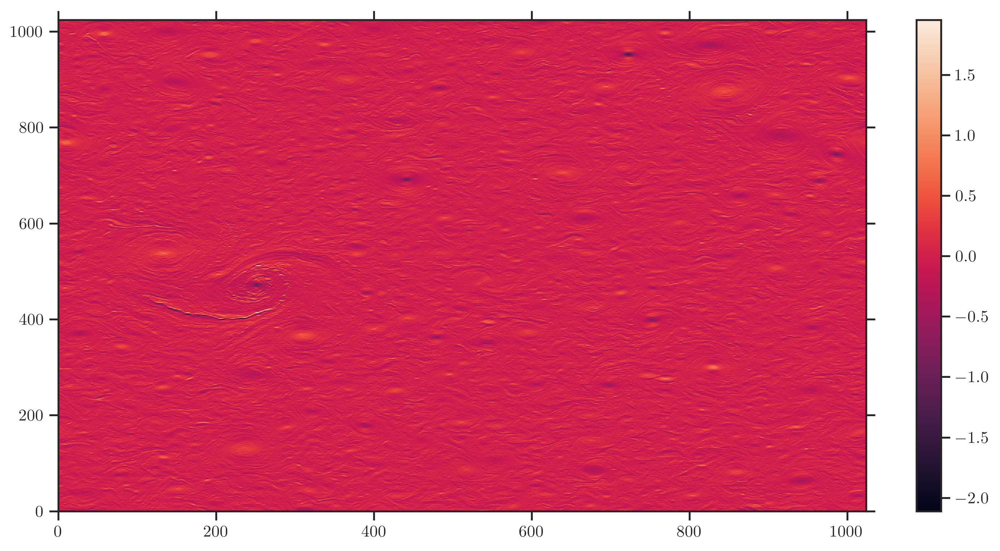

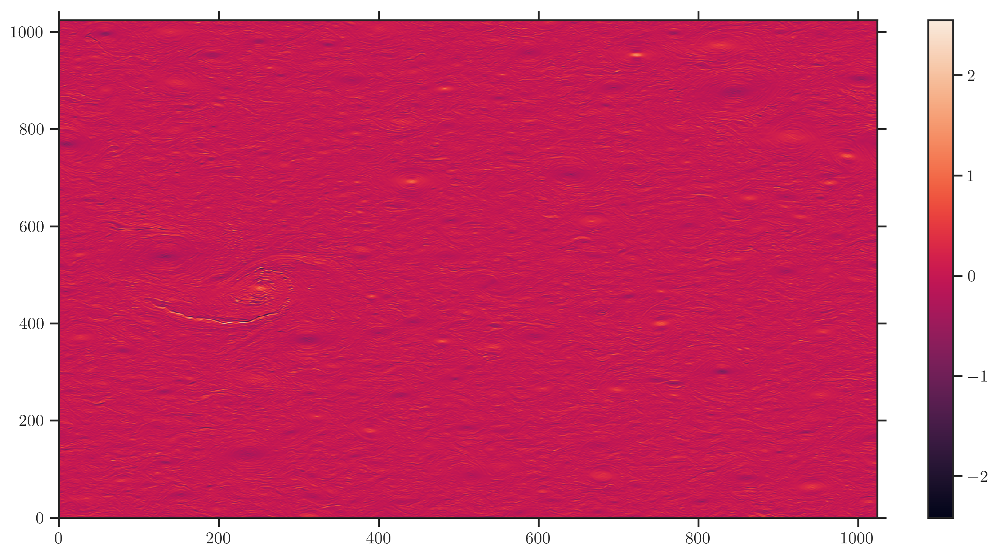

In [51]:
plt.pcolormesh(ugrad_gradient[0])
plt.colorbar()
plt.show()

plt.pcolormesh(ugrad_roll)
plt.colorbar()
plt.show()

In [75]:
np.rolling(1,axis=0).difference(u_snapshots["720000"])

AttributeError: module 'numpy' has no attribute 'rolling'

In [89]:
f['snapshots']['u']['720000'][()]

array([[ 0.18047374,  0.2743455 ,  0.27127477, ...,  0.02372998,
         0.05569442,  0.0878203 ],
       [ 0.1203189 ,  0.1507081 ,  0.14819431, ...,  0.06044796,
         0.06685242,  0.08649034],
       [ 0.10005132,  0.1023483 ,  0.09804889, ...,  0.1221646 ,
         0.04512003,  0.06247922],
       ...,
       [ 0.25757064,  0.23032785,  0.25398177, ...,  0.12957027,
         0.28260605,  0.33695756],
       [ 0.07307783,  0.20703495,  0.31783453, ...,  0.05099217,
         0.11952978,  0.08272339],
       [ 0.05327782,  0.26123892,  0.36647157, ..., -0.00721165,
        -0.03001474, -0.05793588]])

In [90]:
udf = pd.DataFrame(u_snapshots['720000'][()])

In [95]:
%timeit udf.rolling(1,axis=1).apply(lambda x: x[0]-x[-1], raw=True)

670 ms ± 9.51 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [97]:
%timeit np.roll(u_snapshots['720000'],10,axis=1)

5.59 ms ± 165 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [98]:
from scipy.ndimage import shift

In [99]:
shift(u_snapshots["720000"],1,cval=0,axis=0)

TypeError: shift() got an unexpected keyword argument 'axis'

In [142]:
tmpu = u_snapshots["720000"][()]

In [107]:
%timeit tmpu[1:,:] = tmpu[:1023,:] #this rolls by 1 in one of the directions

1.71 ms ± 453 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [151]:
tmpu = u_snapshots["720000"][()]
tmp1 = tmpu[:-1,:]
tmp2 = tmpu[-1,:].copy()
tmpu[1:,:] = tmp1
tmpu[0,:] = tmp2


1.67 ms ± 426 µs per loop (mean ± std. dev. of 7 runs, 100 loops each)


In [154]:
def my_roll(array,num,axis):
    tmp_arr = array
    if axis == 0:
        tmp1 = tmp_arr[:-num,:]
        tmp2 = tmp_arr[-num:,:].copy()
        tmp_arr[num:,:] = tmp1
        tmp_arr[:num,:] = tmp2
    elif axis == 1:
        tmp1 = tmp_arr[:,:-num]
        tmp2 = tmp_arr[:,-num:].copy()
        tmp_arr[:,num:] = tmp1
        tmp_arr[:,:num] = tmp2
    else:
        raise ValueError('Incorrect axis specified, must be 0 or 1')
    
    return(tmp_arr)

In [162]:
my_roll(u_snapshots["720000"][()],-1,0) == np.roll(u_snapshots["720000"][()],-1,axis=0)

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True]])

In [158]:
np.roll(u_snapshots["720000"][()],1,axis=1)[:5,:5]

array([[0.0878203 , 0.18047374, 0.2743455 , 0.27127477, 0.28085189],
       [0.08649034, 0.1203189 , 0.1507081 , 0.14819431, 0.15255062],
       [0.06247922, 0.10005132, 0.1023483 , 0.09804889, 0.11712413],
       [0.19581388, 0.19683674, 0.11004847, 0.04685615, 0.04226219],
       [0.16030096, 0.07463454, 0.00897401, 0.0474345 , 0.08365311]])

In [139]:
uroll[:5,:5]

array([[0.05327782, 0.26123892, 0.36647157, 0.43268957, 0.53635187],
       [0.18047374, 0.2743455 , 0.27127477, 0.28085189, 0.37497919],
       [0.1203189 , 0.1507081 , 0.14819431, 0.15255062, 0.19458651],
       [0.10005132, 0.1023483 , 0.09804889, 0.11712413, 0.13686489],
       [0.19683674, 0.11004847, 0.04685615, 0.04226219, 0.02507373]])

In [140]:
u_snapshots["720000"][()][-1,:5]

array([0.05327782, 0.26123892, 0.36647157, 0.43268957, 0.53635187])

In [58]:
rand_arr = np.ones([2048,2048])

In [64]:
u_snapshots['720000'][()]

array([[ 0.18047374,  0.2743455 ,  0.27127477, ...,  0.02372998,
         0.05569442,  0.0878203 ],
       [ 0.1203189 ,  0.1507081 ,  0.14819431, ...,  0.06044796,
         0.06685242,  0.08649034],
       [ 0.10005132,  0.1023483 ,  0.09804889, ...,  0.1221646 ,
         0.04512003,  0.06247922],
       ...,
       [ 0.25757064,  0.23032785,  0.25398177, ...,  0.12957027,
         0.28260605,  0.33695756],
       [ 0.07307783,  0.20703495,  0.31783453, ...,  0.05099217,
         0.11952978,  0.08272339],
       [ 0.05327782,  0.26123892,  0.36647157, ..., -0.00721165,
        -0.03001474, -0.05793588]])

In [65]:
# %%timeit

def my_func(arr):

    # leng = 100
    # rand_arr = np.random.rand(2048,2048)
    # arr_with_pad = np.zeros([2048,2048])
    padded_arr = []
    for i in np.arange(1,101):
        arr_with_pad = np.zeros([2048,2048])
        arr_with_pad[i:,:] = rand_arr[i:,:]
        padded_arr.append(arr_with_pad)
    return(np.asarray(padded_arr))

my_special_arr = my_func(u_snapshots['720000'][()])


In [66]:
# %%timeit 

def pad_func(arr):

    # rand_arr = np.random.rand(2048,2048)
    padded_arr = []
    for i in np.arange(1,101):
        padded_arr.append(np.pad(rand_arr,((i, 0), (0, 0)),mode="constant",constant_values=0,)[:-i, :])
    return(np.asarray(padded_arr[1:]))

padded_arr  = pad_func(u_snapshots['720000'][()])

In [67]:
padded_arr == my_special_arr[1:]

array([[[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True]],

       [[ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  True,  True],
        ...,
        [ True,  True,  True, ...,  True,  True,  True],
        [ True,  True,  True, ...,  True,  Tr